In [210]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


In [211]:
df=pd.read_excel(r'C:\Users\Siddhant\Desktop\flight_train.xlsx')
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [212]:
dfn=pd.read_excel(r'C:\Users\Siddhant\Desktop\flight_test.xlsx')
dfn.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info


# Basics of the dataset

In [213]:
df.shape


(10683, 11)

In [214]:
dfn.shape

(2671, 10)

In [215]:
df.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
Price               int64
dtype: object

In [216]:
dfn.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
dtype: object

In [217]:
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [218]:
df.nunique()

Airline              12
Date_of_Journey      44
Source                5
Destination           6
Route               128
Dep_Time            222
Arrival_Time       1343
Duration            368
Total_Stops           5
Additional_Info      10
Price              1870
dtype: int64

In [219]:
dfn.nunique()

Airline             11
Date_of_Journey     44
Source               5
Destination          6
Route              100
Dep_Time           199
Arrival_Time       704
Duration           320
Total_Stops          5
Additional_Info      6
dtype: int64

In [220]:
df = pd.concat([df,dfn], ignore_index=True)

In [221]:
df.shape

(13354, 11)

In [222]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897.0
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662.0
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882.0
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218.0
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302.0
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873.0
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087.0
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270.0
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087.0
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625.0


# -->Finding the missing values

In [223]:
count=df.isnull().sum()
count

Airline               0
Date_of_Journey       0
Source                0
Destination           0
Route                 1
Dep_Time              0
Arrival_Time          0
Duration              0
Total_Stops           1
Additional_Info       0
Price              2671
dtype: int64

In [224]:
df = df[df.Route.notnull()]

In [225]:
df = df[df.Total_Stops.notnull()]

In [226]:
count=df.isnull().sum()
count

Airline               0
Date_of_Journey       0
Source                0
Destination           0
Route                 0
Dep_Time              0
Arrival_Time          0
Duration              0
Total_Stops           0
Additional_Info       0
Price              2671
dtype: int64

# Using Labelencoder to transform object values into usable numeric data

In [228]:
from sklearn.preprocessing import LabelEncoder

In [229]:
for i in ['Airline','Date_of_Journey','Route','Dep_Time','Arrival_Time','Duration','Additional_Info']:
    le=LabelEncoder()
    df[i]=le.fit_transform(df[i])
    

In [230]:
df['Source'].replace('Delhi','New Delhi',inplace=True)


In [232]:
country_map = {country:i for i, country in enumerate(df.stack().unique())}

df['Source'] = df['Source'].map(country_map)    
df['Destination'] = df['Destination'].map(country_map)


In [234]:
df['Total_Stops'].replace(['non-stop','1 stop','2 stops','3 stops',' 4 stops'],[0,1,2,3,4],inplace=True)

In [235]:
count=df.isnull().sum()
count

Airline               0
Date_of_Journey       0
Source                0
Destination           0
Route                 0
Dep_Time              0
Arrival_Time          0
Duration              0
Total_Stops           0
Additional_Info       0
Price              2671
dtype: int64

# Now separating the dataset into initial training and test data

In [236]:
train=df.iloc[0:10682,]

In [237]:
test=df.iloc[10683:13354,]

In [238]:
train.shape

(10682, 11)

In [239]:
test.shape

(2670, 11)

# Visualization

In [241]:
df['Total_Stops'].replace(['4 stops'],[4],inplace=True)

In [242]:
train['Total_Stops'] = pd.to_numeric(train['Total_Stops'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000029E50E9E648>,
      dtype=object)

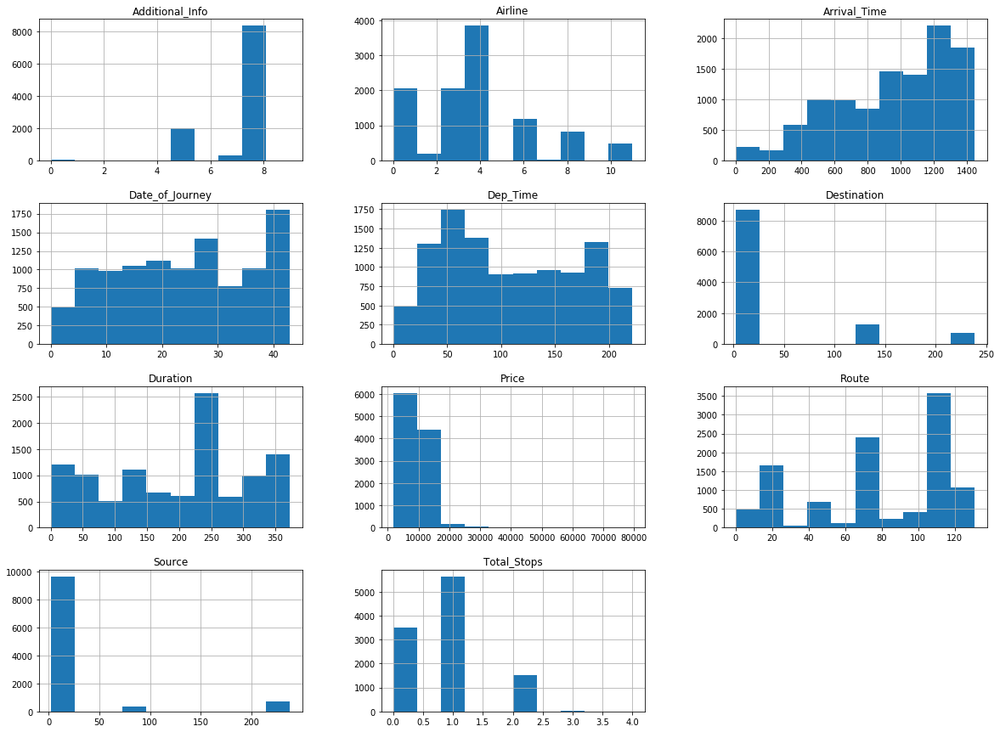

In [243]:
fig = plt.figure(figsize = (20,15))
ax = fig.gca()
train.hist(ax = ax)

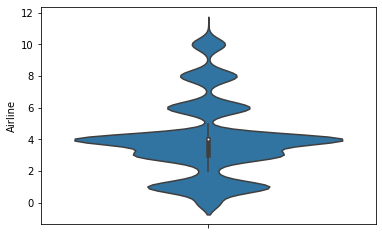

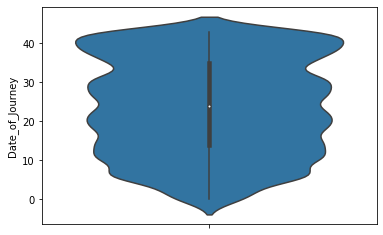

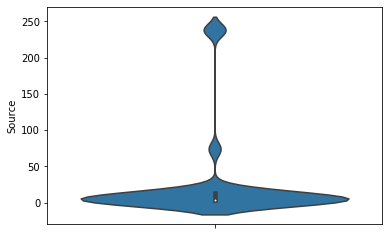

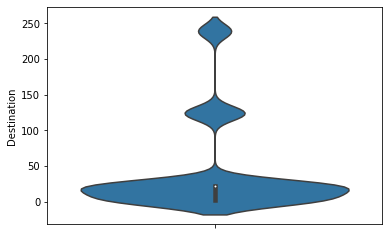

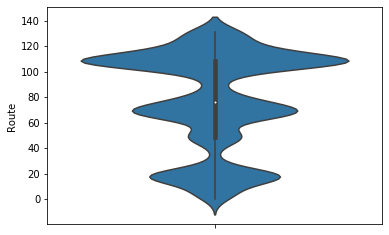

...

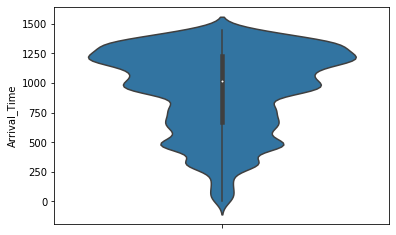

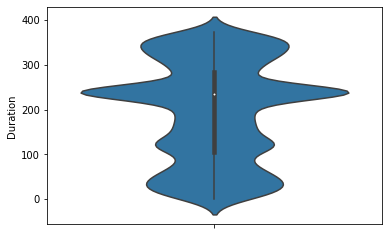

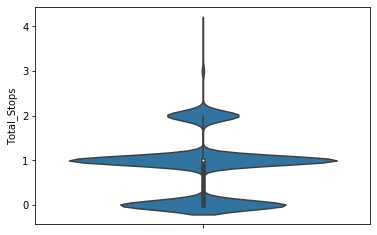

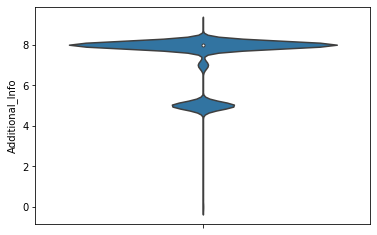

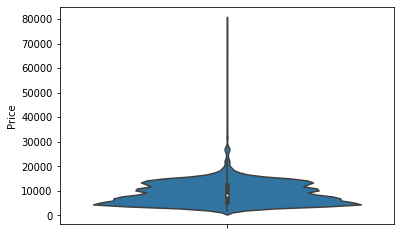

In [244]:
for i in train.columns:
    sns.violinplot(y=i,data=train)
    plt.show()

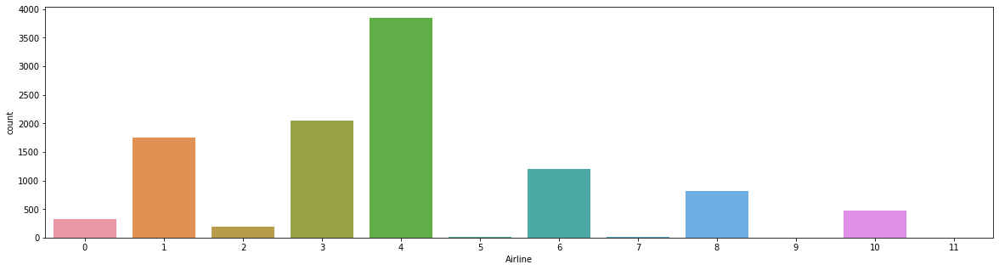

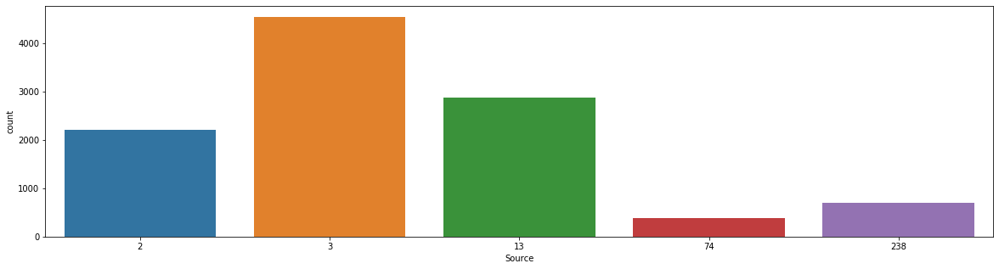

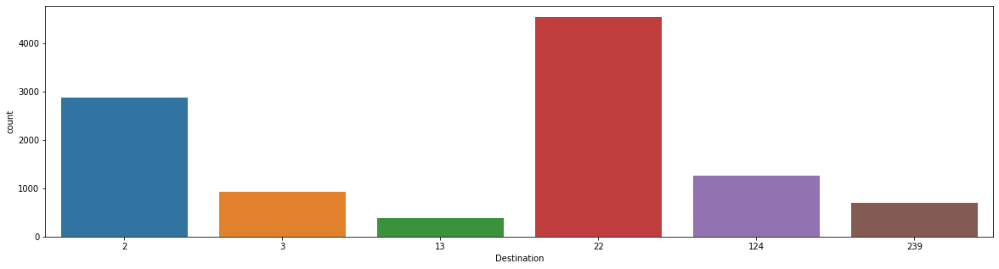

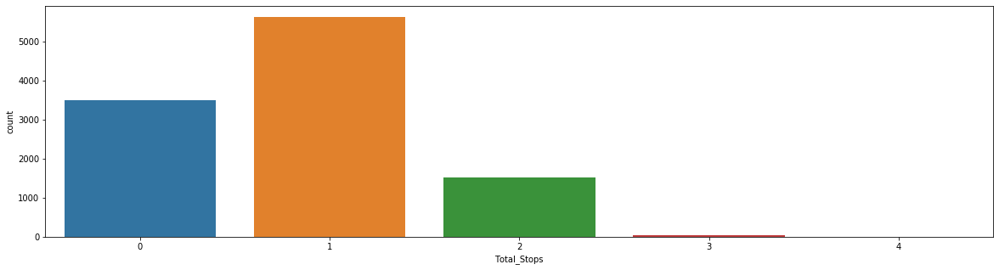

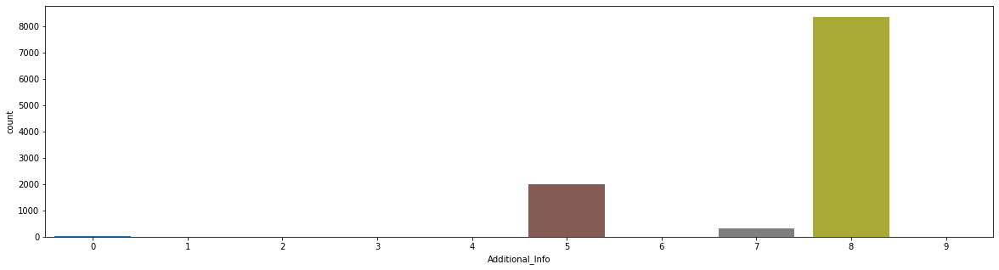

In [245]:
for i in ['Airline','Source','Destination','Total_Stops','Additional_Info']:
    plt.figure(figsize=(20,5))
    sns.countplot(train[i])
    plt.show()

In [246]:
import statistics
for i in ['Date_of_Journey','Route','Dep_Time','Arrival_Time','Duration']:
    print(statistics.mode(train[i]))
    

18
108
172
1180
242


<Figure size 1440x360 with 0 Axes>

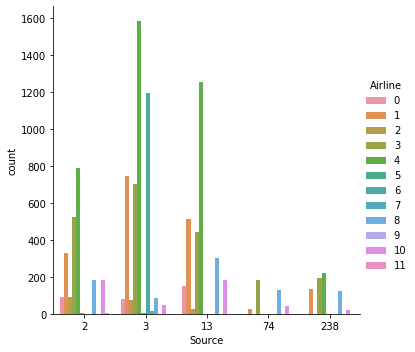

<Figure size 1440x360 with 0 Axes>

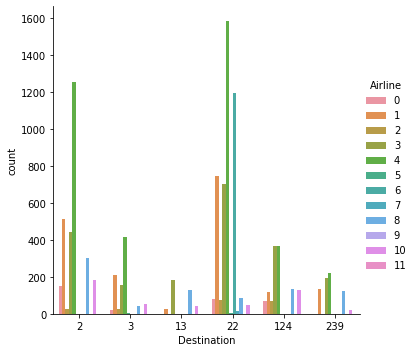

<Figure size 1440x360 with 0 Axes>

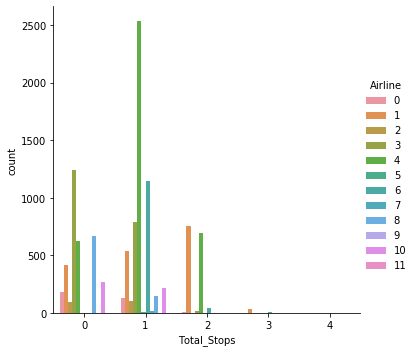

In [247]:
for i in ['Source','Destination','Total_Stops']:
    plt.figure(figsize=(20,5))
    sns.catplot(x=i,kind='count',hue='Airline',data=train)
    plt.show()

<Figure size 1440x360 with 0 Axes>

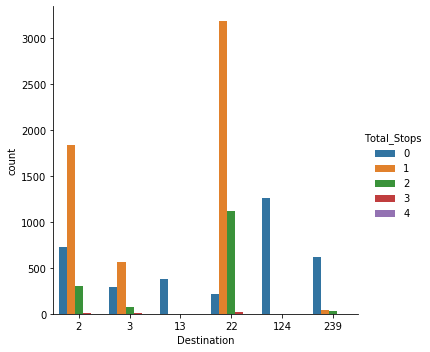

<Figure size 1440x360 with 0 Axes>

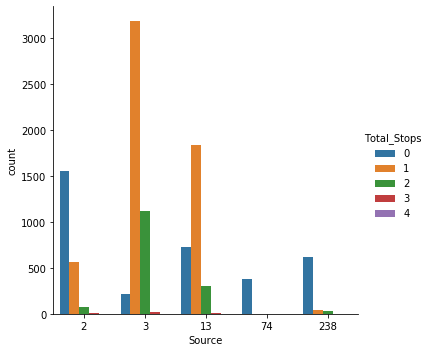

In [248]:
for i in ['Destination','Source']:
    plt.figure(figsize=(20,5))
    sns.catplot(x=i,kind='count',hue='Total_Stops',data=train)
    plt.show()

# Correlation matrix

In [249]:
dco=train.corr()
dco

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
Airline,1.000000,0.022390,0.032338,0.026139,0.024577,-0.039601,-0.017728,0.027956,-0.199396,-0.060748,-0.039565
Date_of_Journey,0.022390,1.000000,0.003762,0.037396,0.275156,-0.007820,-0.012807,-0.000708,0.058474,0.008329,-0.036907
Source,0.032338,0.003762,1.000000,0.766355,-0.138431,-0.002642,-0.034739,-0.153971,-0.307673,0.034029,-0.268768
Destination,0.026139,0.037396,0.766355,1.000000,-0.412201,-0.022510,-0.052589,-0.046872,-0.446197,0.045628,-0.367418
Route,0.024577,0.275156,-0.138431,-0.412201,1.000000,-0.080538,0.011135,-0.059349,0.457759,0.033975,0.166974
Dep_Time,-0.039601,-0.007820,-0.002642,-0.022510,-0.080538,1.000000,-0.028714,0.040834,-0.066473,-0.052787,0.002987
Arrival_Time,-0.017728,-0.012807,-0.034739,-0.052589,0.011135,-0.028714,1.000000,0.027947,0.046813,0.015826,0.028746
Duration,0.027956,-0.000708,-0.153971,-0.046872,-0.059349,0.040834,0.027947,1.000000,-0.169916,0.079611,-0.141117
Total_Stops,-0.199396,0.058474,-0.307673,-0.446197,0.457759,-0.066473,0.046813,-0.169916,1.000000,-0.082439,0.603897
Additional_Info,-0.060748,0.008329,0.034029,0.045628,0.033975,-0.052787,0.015826,0.079611,-0.082439,1.000000,-0.065463


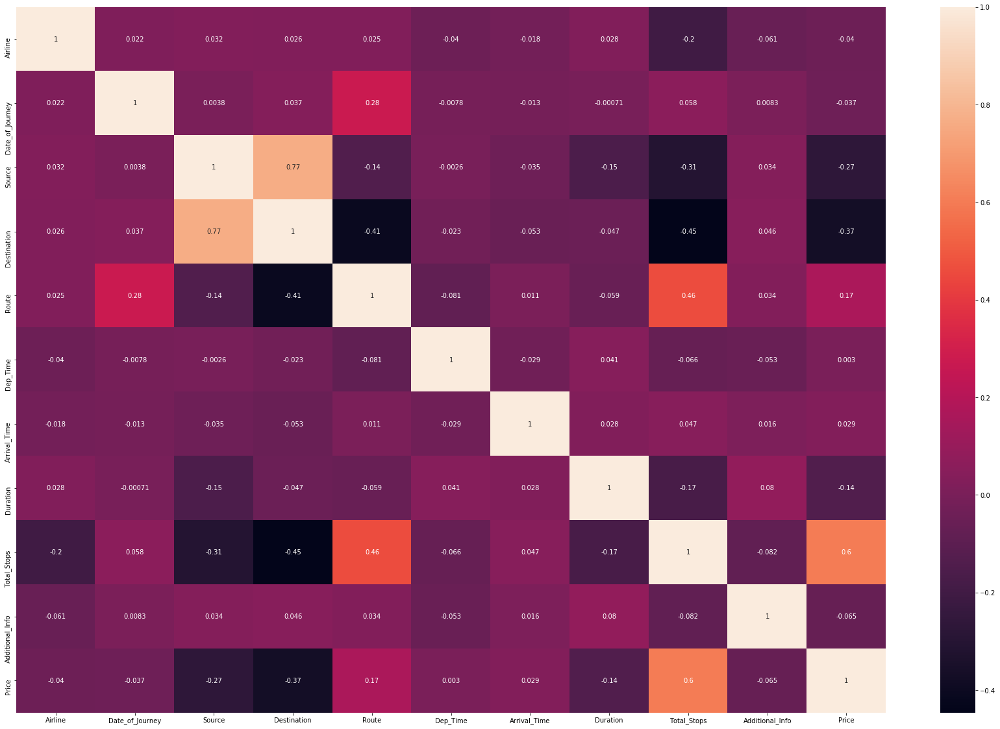

In [250]:
plt.figure(figsize=(30,20))
sns.heatmap(dco,annot=True)

# Statistics Summary

In [251]:
train.describe()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
count,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000
mean,3.966205,23.733758,23.348156,40.884291,77.553548,108.015821,945.565718,196.396087,0.824190,7.392998,9087.214567
std,2.352090,12.337569,58.280199,63.955405,38.249250,61.144655,350.252597,110.701411,0.675229,1.214254,4611.548810
min,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1759.000000
25%,3.000000,14.000000,3.000000,2.000000,49.000000,55.000000,671.000000,106.000000,0.000000,8.000000,5277.000000
50%,4.000000,24.000000,3.000000,22.000000,76.000000,96.000000,1018.000000,235.000000,1.000000,8.000000,8372.000000
75%,4.000000,35.000000,13.000000,22.000000,108.000000,164.000000,1229.000000,284.000000,1.000000,8.000000,12373.000000
max,11.000000,43.000000,238.000000,239.000000,131.000000,222.000000,1449.000000,373.000000,4.000000,9.000000,79512.000000


# Checking for skewness and outliers distribution:-

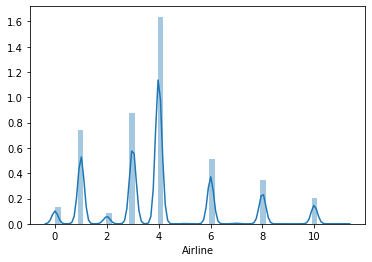

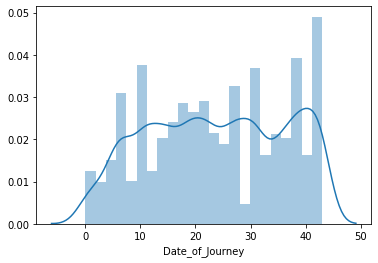

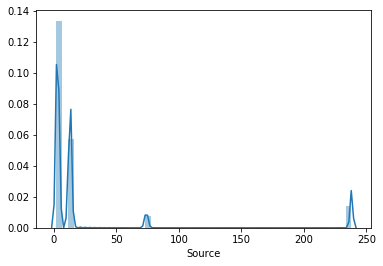

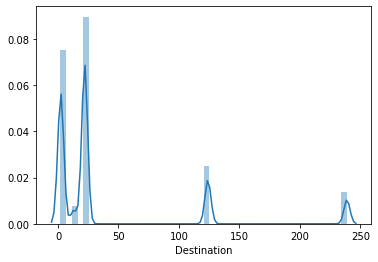

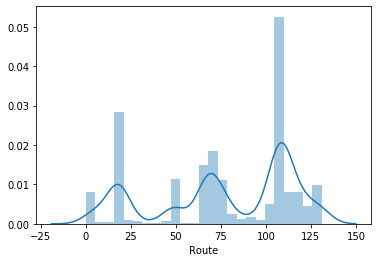

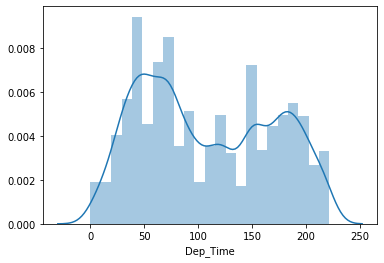

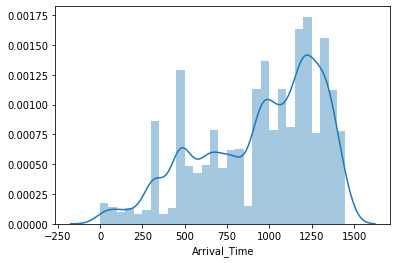

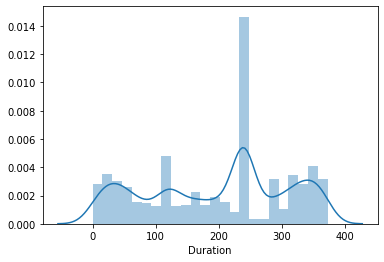

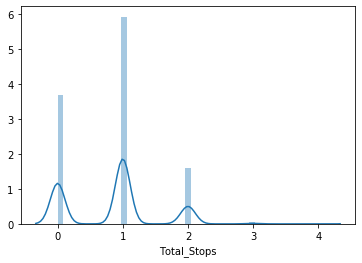

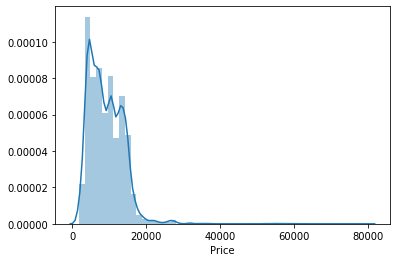

In [252]:
for i in ['Airline','Date_of_Journey','Source','Destination','Route','Dep_Time','Arrival_Time','Duration','Total_Stops','Price']:
    sns.distplot(train[i])
    plt.show()
    

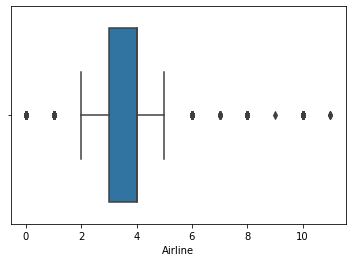

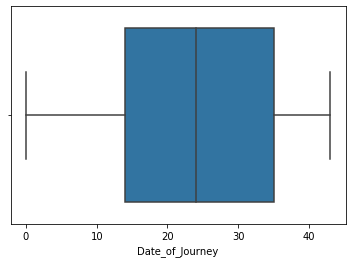

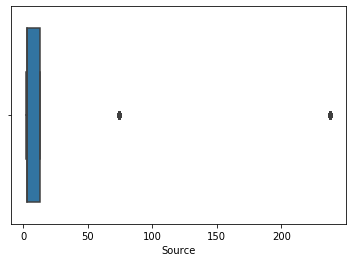

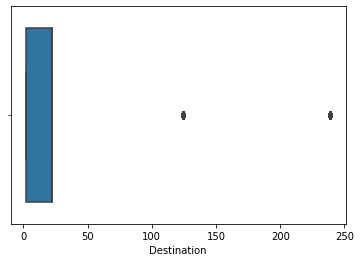

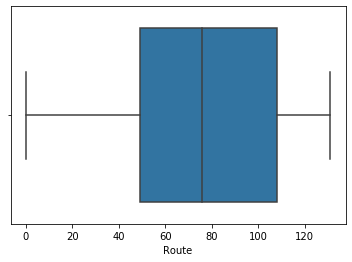

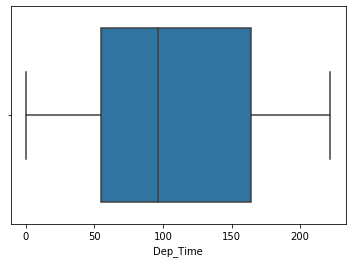

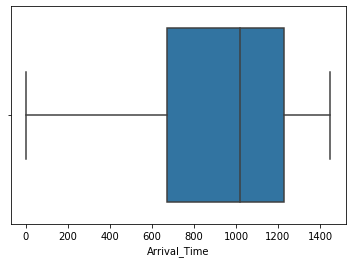

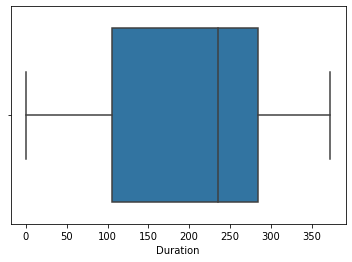

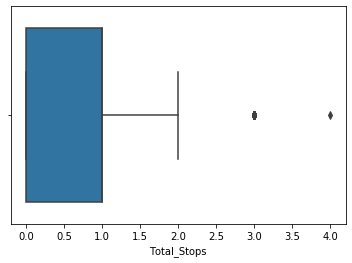

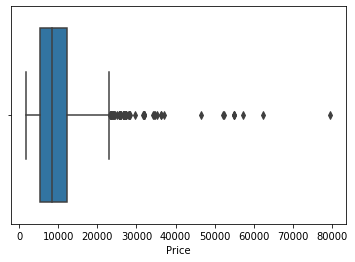

In [253]:
for i in ['Airline','Date_of_Journey','Source','Destination','Route','Dep_Time','Arrival_Time','Duration','Total_Stops','Price']:
    sns.boxplot(train[i])
    plt.show()

In [254]:
from scipy.stats import zscore

In [255]:
z_score=abs(zscore(train))
print(train.shape)
dffinal=train.loc[(z_score<3).all(axis=1)]
print(dffinal.shape)

(10682, 11)
(9842, 11)


In [256]:
dffinal.skew()

Airline            0.724368
Date_of_Journey   -0.061031
Source             3.974241
Destination        1.973849
Route             -0.677239
Dep_Time           0.199126
Arrival_Time      -0.652095
Duration          -0.311957
Total_Stops        0.146764
Additional_Info   -1.509779
Price              0.410239
dtype: float64

In [257]:
for col in dffinal.columns:
    if dffinal.skew().loc[col]>0.55:
        dffinal[col]=np.log1p(dffinal[col])

In [258]:
dffinal.skew()

Airline           -0.718247
Date_of_Journey   -0.061031
Source             1.347446
Destination        0.202939
Route             -0.677239
Dep_Time           0.199126
Arrival_Time      -0.652095
Duration          -0.311957
Total_Stops        0.146764
Additional_Info   -1.509779
Price              0.410239
dtype: float64

# Now,scaling of data has to be done

In [259]:
xn=dffinal.drop(columns=['Price'])
yn=dffinal['Price']

In [260]:
from sklearn.preprocessing import StandardScaler

In [261]:
scale=StandardScaler()
xn=scale.fit_transform(xn)


In [262]:
xd=pd.DataFrame(xn)


In [263]:
xd.skew()

0   -0.718247
1   -0.061031
2    1.347446
3    0.202939
4   -0.677239
5    0.199126
6   -0.652095
7   -0.311957
8    0.146764
9   -1.509779
dtype: float64

In [264]:
xd.isnull().sum()

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

In [265]:
yn.isnull().sum()

0

# Splitting the train file to select best model

In [266]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(xd,yn,test_size=.20,random_state=42)

In [267]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.externals import joblib

In [268]:
print(xtrain.shape,xtest.shape)

(7873, 10) (1969, 10)


In [269]:
print(ytrain.shape,ytest.shape)

(7873,) (1969,)


In [270]:
def maxr2_score(regr,xd,yn):
    max_r_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(xd,yn,test_size=.20,random_state=r_state)
        regr.fit(xtrain,ytrain)
        ypred=regr.predict(xtest)
        r2_scr=r2_score(ytest,ypred)
        print('r2 score corresponding to ',r_state,'is',r2_scr)
        if r2_scr>max_r_score:
            max_r_score= r2_scr
            finalrstate=r_state
    print('max r2 score corresponding to',finalrstate,'is',max_r_score)
    return finalrstate

In [271]:
lr = LinearRegression()
svr = SVR()
knr=KNeighborsRegressor()
rfr=RandomForestRegressor()
gbr=GradientBoostingRegressor()
ada=AdaBoostRegressor()
dtr=DecisionTreeRegressor()

parameters={'C': [100, 10, 1.0, 0.1,0.01],'kernel':['linear','poly', 'rbf']}
clf=GridSearchCV(svr,parameters)
clf.fit(xd,yn)
print('best SVR parameters is :',clf.best_params_)
print('\n')
parameters={'n_neighbors':range(1,30)}
clf=GridSearchCV(knr,parameters)
clf.fit(xd,yn)
print('best KNR parameters is :',clf.best_params_)
print('\n')
parameters={'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(rfr,parameters,cv=5)
clf.fit(xd,yn)
print('best RFR parameters is :',clf.best_params_)
print('\n')
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(xd,yn)
print('best GBR parameters is :',clf.best_params_)
print('\n')
parameters={'learning_rate':[0.01,0.1,1],'n_estimators':[50,100,150,200,250,300],'base_estimator':[lr,dtr]}
clf=GridSearchCV(ada,parameters,cv=5)
clf.fit(xd,yn)
print('best ADA parameters is :',clf.best_params_)
print('\n')
alphavalue={'alpha':[1,0.1,0.001,0.0001]}
list=[Lasso(),Ridge(),ElasticNet()]
for i in list:
    grid=GridSearchCV(estimator=i,param_grid=alphavalue)
    grid.fit(xd,yn)
    print(grid.best_score_)
    print(grid.best_estimator_.alpha)
    print(grid.best_params_)
    print('\n')

best SVR parameters is : {'C': 100, 'kernel': 'rbf'}


best KNR parameters is : {'n_neighbors': 4}


best RFR parameters is : {'n_estimators': 250}


best GBR parameters is : {'learning_rate': 1, 'n_estimators': 250}


best ADA parameters is : {'base_estimator': DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best'), 'learning_rate': 0.1, 'n_estimators': 300}


0.4694174391339058
0.1
{'alpha': 0.1}


0.4694176417854735
1
{'alpha': 1}


0.46941820448236254
0.001
{'alpha': 0.001}




In [272]:
lr = LinearRegression()
r_state=maxr2_score(lr,xd,yn)
print('\n')
svr = SVR(C=100,kernel='rbf')
r_state=maxr2_score(svr,xd,yn)
print('\n')
knr=KNeighborsRegressor(n_neighbors= 4)
r_state=maxr2_score(knr,xd,yn)
print('\n')
rfr=RandomForestRegressor(n_estimators=250)
r_state=maxr2_score(rfr,xd,yn)
print('\n')
gbr=GradientBoostingRegressor(learning_rate=1,n_estimators=250)
r_state=maxr2_score(gbr,xd,yn)
print('\n')
ada=AdaBoostRegressor(learning_rate=0.1,n_estimators=300,base_estimator=dtr)
r_state=maxr2_score(ada,xd,yn)
print('\n')
ela=ElasticNet(alpha=0.001)
r_state=maxr2_score(ela,xd,yn)
print('\n')


r2 score corresponding to  42 is 0.4579360664725004
r2 score corresponding to  43 is 0.45818259857760224
r2 score corresponding to  44 is 0.48472576641482135
r2 score corresponding to  45 is 0.4879689771575404
r2 score corresponding to  46 is 0.4799804901059147
r2 score corresponding to  47 is 0.48052866049978094
r2 score corresponding to  48 is 0.47507644298431195
r2 score corresponding to  49 is 0.4620677087081221
r2 score corresponding to  50 is 0.4845069233635759
r2 score corresponding to  51 is 0.46092971634457536
r2 score corresponding to  52 is 0.48551690526741487
r2 score corresponding to  53 is 0.48466357201742216
r2 score corresponding to  54 is 0.4416281697761658
r2 score corresponding to  55 is 0.4588489646807098
r2 score corresponding to  56 is 0.4749031557311918
r2 score corresponding to  57 is 0.48189130665258806
r2 score corresponding to  58 is 0.4658473947771
r2 score corresponding to  59 is 0.46974461707558424
r2 score corresponding to  60 is 0.47064999095790905
r2 sc

r2 score corresponding to  83 is 0.7294889524581534
r2 score corresponding to  84 is 0.7243950090121347
r2 score corresponding to  85 is 0.7400442457038439
r2 score corresponding to  86 is 0.7352420103202006
r2 score corresponding to  87 is 0.7380797960350309
r2 score corresponding to  88 is 0.754818106863686
r2 score corresponding to  89 is 0.7428437063011817
r2 score corresponding to  90 is 0.7466384824916121
r2 score corresponding to  91 is 0.7526042946336876
r2 score corresponding to  92 is 0.7430456688339226
r2 score corresponding to  93 is 0.748499687531381
r2 score corresponding to  94 is 0.7521645545548589
r2 score corresponding to  95 is 0.7396206071734338
r2 score corresponding to  96 is 0.7219226600993224
r2 score corresponding to  97 is 0.7177056540036029
r2 score corresponding to  98 is 0.7485167350279223
r2 score corresponding to  99 is 0.7177577893899789
max r2 score corresponding to 74 is 0.7694341046448722


r2 score corresponding to  42 is 0.8865856693160573
r2 score 

r2 score corresponding to  64 is 0.8924637939498156
r2 score corresponding to  65 is 0.9020944629123813
r2 score corresponding to  66 is 0.8924402380548921
r2 score corresponding to  67 is 0.8898527298876874
r2 score corresponding to  68 is 0.8811908597551213
r2 score corresponding to  69 is 0.8774688337036651
r2 score corresponding to  70 is 0.899899463267202
r2 score corresponding to  71 is 0.9077127338793062
r2 score corresponding to  72 is 0.8807959400418363
r2 score corresponding to  73 is 0.8794526936848959
r2 score corresponding to  74 is 0.891768996701878
r2 score corresponding to  75 is 0.8793172882920268
r2 score corresponding to  76 is 0.8793915455573598
r2 score corresponding to  77 is 0.8712027069388344
r2 score corresponding to  78 is 0.8801818094921154
r2 score corresponding to  79 is 0.8975292429010624
r2 score corresponding to  80 is 0.8934150760049291
r2 score corresponding to  81 is 0.886748240169467
r2 score corresponding to  82 is 0.8750353414675076
r2 score corres

In [273]:
models=[]
models.append(('LinearRegression',lr))
models.append(('SVR',svr))
models.append(('kNeighborsRegressor',knr))
models.append(('RFR',rfr))
models.append(('GBR',gbr))
models.append(('ADAREG',ada))
models.append(('Elastic',ela))


In [274]:
from sklearn.model_selection import cross_val_score

In [275]:
Model=[]
score=[]
cvs=[]
for name,model in models:
    print('****,name,****')
    print('\n')
    Model.append(name)
    model.fit(xtrain,ytrain)
    print(model)
    pre=model.predict(xtest)
    print('\n')
    RS=r2_score(ytest,pre)
    print('r2 score',RS)
    score.append(RS*100)
    print('\n')
    sc=cross_val_score(model,xd,yn,cv=5,scoring='r2').mean()
    print('Cross val score',sc)
    cvs.append(sc*100)
    print('\n')
    

****,name,****


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


r2 score 0.4579360664725004


Cross val score 0.4694174021821131


****,name,****


SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)


r2 score 0.5405567895793082


Cross val score 0.5656810936130123


****,name,****


KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                    weights='uniform')


r2 score 0.7407319888792254


Cross val score 0.7406915768947014


****,name,****


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_sa

In [276]:
result=pd.DataFrame({'Model':Model,'r2_score': score,'Cross val score': cvs})
result

,Model,r2_score,Cross val score
0,LinearRegression,45.793607,46.941740
1,SVR,54.055679,56.568109
2,kNeighborsRegressor,74.073199,74.069158
3,RFR,88.783525,89.562231
4,GBR,89.319569,90.061891
5,ADAREG,87.439632,88.357569
6,Elastic,45.792285,46.941820


# After having tried all the above models , GBR is working best
Also, random state corresponding to max r2 score in GBR is 93

In [277]:
xtrain,xtest,ytrain,ytest=train_test_split(xd,yn,test_size=.20,random_state=93)
gbr=GradientBoostingRegressor(learning_rate=1,n_estimators=250)
gbr.fit(xtrain,ytrain)
ypred=gbr.predict(xtest)

# Final model is as follows

In [278]:
print('RMSE is',np.sqrt(mean_squared_error(ytest,ypred)))
print('r2_score is',r2_score(ytest,ypred))

RMSE is 1150.4475110235242
r2_score is 0.9135450190513072


# Getting the test file

In [279]:
test

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
10684,3,10,13,2,94,37,809,301,1,8,NaN
10685,4,22,3,22,108,176,1193,166,1,5,NaN
10686,6,22,3,22,108,55,1308,36,1,8,NaN
10687,0,27,2,124,18,222,424,242,0,8,NaN
10688,4,11,3,22,108,165,968,98,1,5,NaN
10689,1,8,2,3,33,51,1355,71,1,8,NaN
10690,3,6,13,2,83,132,1292,315,1,8,NaN
10691,3,12,13,2,67,79,978,241,0,8,NaN
10692,4,18,13,2,69,145,1355,337,1,8,NaN
10693,4,20,3,22,124,117,1177,225,2,5,NaN


In [280]:
test.drop(columns=['Price'],inplace=True)

In [281]:
test.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

In [284]:
test.dtypes

Airline             int32
Date_of_Journey     int32
Source              int64
Destination         int64
Route               int32
Dep_Time            int32
Arrival_Time        int32
Duration            int32
Total_Stops        object
Additional_Info     int32
dtype: object

In [285]:
test['Total_Stops'] = pd.to_numeric(test['Total_Stops'])

In [286]:
z_score=abs(zscore(test))
print(test.shape)
dfnew=test.loc[(z_score<3).all(axis=1)]
print(dfnew.shape)

(2670, 10)
(2469, 10)


In [287]:
dfnew.skew()

Airline            0.681075
Date_of_Journey   -0.028554
Source             4.374048
Destination        1.974391
Route             -0.670065
Dep_Time           0.187876
Arrival_Time      -0.704168
Duration          -0.290877
Total_Stops        0.120796
Additional_Info   -1.685231
dtype: float64

In [288]:
for col in dfnew.columns:
    if dfnew.skew().loc[col]>0.55:
        dfnew[col]=np.log1p(dfnew[col])

In [289]:
dfnew.skew()

Airline           -0.734000
Date_of_Journey   -0.028554
Source             1.348382
Destination        0.206934
Route             -0.670065
Dep_Time           0.187876
Arrival_Time      -0.704168
Duration          -0.290877
Total_Stops        0.120796
Additional_Info   -1.685231
dtype: float64

In [290]:
dfnew.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

In [291]:
scale=StandardScaler()
dfnew=scale.fit_transform(dfnew)


In [292]:
d_final=pd.DataFrame(dfnew)


In [293]:
d_final.isnull().sum()

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

In [295]:
joblib.dump(gbr,'Model_flight.obj')

['Model_flight.obj']

In [296]:
model=joblib.load('Model_flight.obj')

# Using the test file to make predictions

In [297]:
model.predict(d_final)

array([ 5415.95239304,  9513.55535742, 11967.80527153, ...,
       18407.19502815, 14005.86349957,  9162.31090179])